# Radial Metrics

In [1]:
from pathlib import Path
# from project_heart.lv import LV
from project_heart.utils import set_jupyter_backend
from project_heart.enums import *
set_jupyter_backend("pythreejs")
import logging
import numpy as np
float_formatter = "{:.5f}".format
np.set_printoptions(formatter={'float_kind':float_formatter})

from project_heart.examples import get_lv_ideal
from project_heart.examples import get_lv_typeA

lv_ideal = get_lv_ideal(Path("../../_static/sample_files/ideal_linear_pressure_increase copy.xplt"))
lv_typeA = get_lv_typeA(
    Path("../../_static/sample_files/lv_typeA_hex.vtk"),
    Path("../../_static/sample_files/sample_displacement_lv_typeA_hex_states_linear_press_incr.pbz2")
    )

sample_spk_typeA = lv_typeA.get_speckles(spk_name="SAMPLE", spk_group="epi", spk_collection="SAMPLE")[0]

## Radial metrics

In our implementation, 'radial metrics' are defined as any metric that relates a point with the left ventricle's longitudinal axis. In a clinical setting, these metrics are used to compute radial shortening and radial strain. However, it is often unclear how to proper establish its calculation as different reference points related to the longitudinal axis can be selected. 
For instance, we can use a 'center' point located at a specified 'height' of the longitudinal axis and compute the vector length from this reference to a point on the endocardium surface. On the other hand, we can compute the perpendicular distance between a point on the endocardium and the longitudinal axis. 
With this in mind, we provided two distinct metrics for radial measurements: 'Radial Distance' and 'Radial Length'. 

In addition, our implementation consider the usage of [Speckles](../basic_definitions/speckles.ipynb), which helps to approximate a clinical setting, facilitates the computation for certain metrics and helps to minimizing errors due to noise in geometry by averaging values based on local regions. See [docs](../basic_definitions/speckles.ipynb) for details.

Moreover, the final metric is computed by applying [reduction](./radial_metrics.ipynb) accross values computed from individual speckles. The [default reduction method](./radial_metrics.ipynb) is the 'mean' value for all selected speckles. For instance, if we apply this computation accross speckles at endocardium, we will have the mean values for the endocardium region. 

For documentation purposes, we will be using 'Sample' speckles at the Epicardium:

In [2]:
sample_spk_ideal = lv_ideal.get_speckles(spk_name="SAMPLE", spk_group="epi", spk_collection="SAMPLE")[0]

### Radial Distance

**Definition**: Perpendicular distance from a given point to normal vector (defined from longitudinal line)

The 'Radial distance' is computed as the perpendicular distance (shortest euclidean distance) between a point (based on speckles) at a given region of the geometry and the longitudinal axis. Considering tha such axis is aligned with the Z axis, this metric can be thought as the '2D radius' from a top view (xy plane).

Here is an example:

In [3]:
rd = lv_ideal.plot_speckles_radial_distances(sample_spk_ideal, t=0.0)

Renderer(camera=PerspectiveCamera(aspect=1.5, children=(DirectionalLight(color='#fefefe', position=(50000.0000…

*rd represents the average radial distance among the selected speckles. We will use it to compare with our metric computation.*

In [4]:
rds = lv_ideal.radial_distance(
            sample_spk_ideal,         # selected speckles
            approach="moving_vector", # choice of reference LA axis
            method="mean",            # reduction method (default)
            t=0.0,                    # return value at given timestep
            recompute=True,           # forces recomputation (ignores previous computations)
            log_level=logging.ERROR, 
        )

INFO:LV.BaseMetricsComputations:Computing metric 'LV_STATES.RADIAL_DISTANCE'


Let's check if our algorithm implementation matches the expected result:

In [5]:
print("Sample radial distance:", rd)
print("Reduced radial distance by internal algorithm:", rds)

Sample radial distance: 34.93394608696435
Reduced radial distance by internal algorithm: 34.93394608696434


#### Fixed vs Moving vector

During a cardiac cycle, contractions may cause the longitudinal axis of the left ventricle to change. This occurs spontaneously owing to the fiber composition of the heart tissue and affects the radial distance value. 

Taking this into account, we have two approaches regarding radial distance computation: ***fixed_vector*** and ***moving_vetor***. The first approach uses the reference configuration as the basis vector for computation, while the second accounts for possible oscillations that might occur thoughout timesteps by using variable positions for apex and base reference nodes (thus creating a 'new' longitudinal axis for each timestep).

Here is an example of how these two approaches can impact the result:

In [6]:
rd_mv = lv_typeA.plot_speckles_radial_distances(sample_spk_typeA, t=0.15, 
                                             approach="moving_vector", 
                                             plot_kwargs={"style": None})

Renderer(camera=PerspectiveCamera(aspect=1.5, children=(DirectionalLight(color='#fefefe', position=(50000.0000…

In [7]:
rd_fv = lv_typeA.plot_speckles_radial_distances(sample_spk_typeA, t=0.15, 
                                             approach="fixed_vector", 
                                             plot_kwargs={"style": None})

Renderer(camera=PerspectiveCamera(aspect=1.5, children=(DirectionalLight(color='#fefefe', position=(50000.0000…

Let's check the numerical comparison:

In [8]:
print("with moving vector:", rd_mv)
print("with fixed vector:", rd_fv)

with moving vector: 32.9129460160627
with fixed vector: 34.56766567007306


As described in [1](https://core.ac.uk/reader/53744593?utm_source=linkout), the base reference node should be estimated at mid-point the 'right' and 'left' base; transposing this to 3 dimensions, the base should be estimated as the centroid of top-most nodes of endocardium. Our implementation takes this into consideration, see [geo references](../basic_definitions/geo_references.ipynb) for details.

### Radial Length

**Definition**: Vector magnitude from a given point to a point located at the longitudinal axis (not necessarily the perpendicular distance)

The 'Radial Length' is computed using the vector maginitude from a point at given region of the geometry and a corresponding 'center' located along the longitudinal axis. This reference 'center' is defined based on the longitudinal axis at an average height of the query points. If only one point is in the query, then this metric should reflect the same value as 'radial distance'.
The purpose of this metric is to capture not only radial characteristics in a single plane (perpendicular to geometry's normal), but also curvature information in the given region. 

Note that this metric is intended to be used with speckles, therefore, the reference 'center' will be the corresponding point along the longitudinal axis at the mean heigh of the given speckles. 

In addition, as we base the 'height' on Z axis *(for now)*, this algorithm is constrained on the geometry's longitudinal axis being aligned with the Z axis.

Here is an example:

In [9]:
rl = lv_ideal.plot_speckles_radial_lengths(sample_spk_ideal, t=0.0)

Renderer(camera=PerspectiveCamera(aspect=1.5, children=(DirectionalLight(color='#fefefe', position=(50000.0000…

In [10]:
rls = lv_ideal.radial_length(
            sample_spk_ideal,          # selected speckles
            approach="moving_centers", # choice of reference LA axis
            method="mean",             # reduction method (default)
            t=0.0,                     # return value at given timestep
            recompute=True,            # forces recomputation (ignores previous computations)
            log_level=logging.ERROR, 
        )

INFO:LV.BaseMetricsComputations:Computing metric 'LV_STATES.RADIAL_LENGTH'


In [11]:
print("Sample radial length:", rl)
print("Reduced radial length by internal algorithm:", rls)

Sample radial length: 35.00998793122385
Reduced radial length by internal algorithm: 35.00998793122385


#### Fixed vs moving centers

Similarly from radial distance, we implemented two approaches for radial length: ***fixed_centers*** and ***moving_centers***. The first uses the reference center when speckles were created, while the second recomputes the centers based on the 'moving' longitudinal axis. Here is an example:

In [12]:
rl_mv = lv_typeA.plot_speckles_radial_lengths(sample_spk_typeA, t=0.15, 
                                             approach="moving_centers")

Renderer(camera=PerspectiveCamera(aspect=1.5, children=(DirectionalLight(color='#fefefe', position=(50000.0000…

In [13]:
rl_fv = lv_typeA.plot_speckles_radial_lengths(sample_spk_typeA, t=0.15, 
                                             approach="fixed_centers")

Renderer(camera=PerspectiveCamera(aspect=1.5, children=(DirectionalLight(color='#fefefe', position=(50000.0000…

In [14]:
print("with moving centers:", rl_mv)
print("with fixed centers:", rl_fv)

with moving centers: 32.9897422290473
with fixed centers: 34.633829070951435


## Comparing Radial Metrics

### Comparing thickness between speckles and their effect

In [15]:
def plot_all_radial_metrics(lv, spks, title=""):
        timestep = lv.timesteps()
        mask = timestep >=0.1
        
        radial_dist_1 = lv.radial_distance(spks, 
                                        reduce_by={"group", "name"},
                                        approach="fixed_vector",
                                        recompute=True, 
                                        log_level=logging.ERROR)[mask]
        radial_dist_2 = lv.radial_distance(spks, 
                                        reduce_by={"group", "name"},
                                        approach="moving_vector",
                                        #  ql="",
                                        recompute=True, 
                                        log_level=logging.ERROR)[mask]
        radial_length_1 = lv.radial_length(spks, 
                                        recompute=True, 
                                        reduce_by={"group", "name"},
                                        approach="fixed_centers",
                                        log_level=logging.ERROR)[mask]
        radial_length_2 = lv.radial_length(spks, 
                                        recompute=True, 
                                        reduce_by={"group", "name"},
                                        approach="moving_centers",
                                        log_level=logging.ERROR)[mask]
        timestep = timestep[mask] - 0.1
        data = np.hstack([
                        timestep.reshape((-1,1)), 
                        radial_dist_1.reshape((-1,1)), 
                        radial_dist_2.reshape((-1,1)),
                        radial_length_1.reshape((-1,1)), 
                        radial_length_2.reshape((-1,1))
                        ])
        
        import pandas as pd
        

        df = pd.DataFrame(data,columns=[
                "timestep", 
                "radial_distance_fixed_vector", 
                "radial_distance_moving_vector", 
                "radial_length_fixed_centers",
                "radial_length_moving_centers",
                ])
        df.plot(x="timestep", figsize=(10,5), grid=True, title=title)

Here we are comparing the effect of using thick, thin or mid-size speckes in terms.

INFO:LV.BaseMetricsComputations:Computing metric 'LV_STATES.RADIAL_DISTANCE'


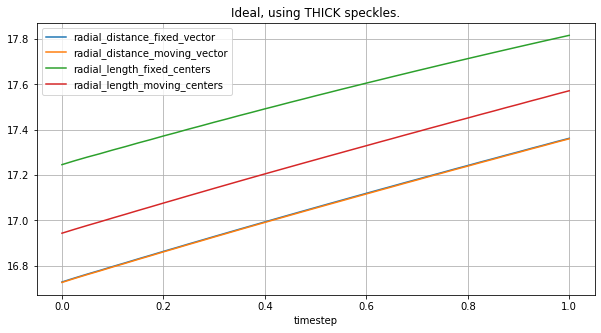

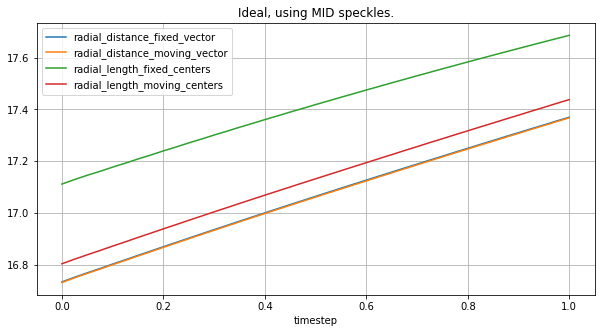

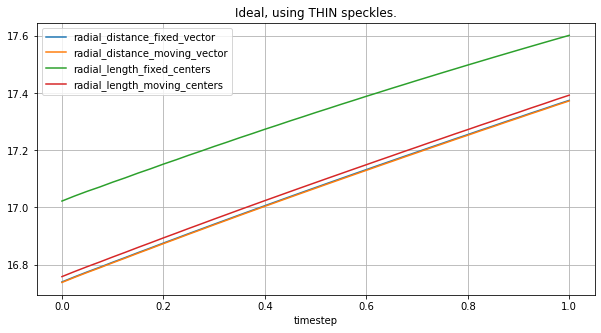

In [16]:
thick_spks = lv_ideal.get_speckles(spk_name="THICK", spk_group="endo", spk_collection="SAMPLE")
mid_spks = lv_ideal.get_speckles(spk_name="MID", spk_group="endo", spk_collection="SAMPLE")
thin_spks = lv_ideal.get_speckles(spk_name="THIN", spk_group="endo", spk_collection="SAMPLE")

plot_all_radial_metrics(lv_ideal, thick_spks, "Ideal, using THICK speckles.")
plot_all_radial_metrics(lv_ideal, mid_spks, "Ideal, using MID speckles.")
plot_all_radial_metrics(lv_ideal, thin_spks, "Ideal, using THIN speckles.")

Same comparison, but on a typeA geometry:

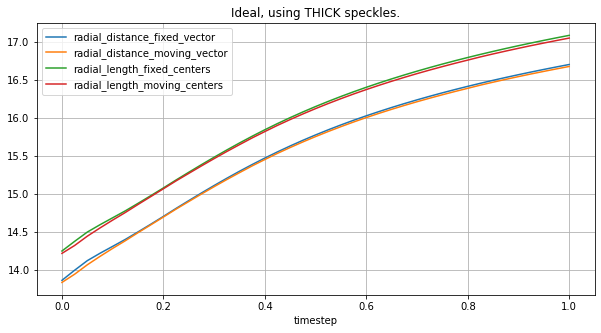

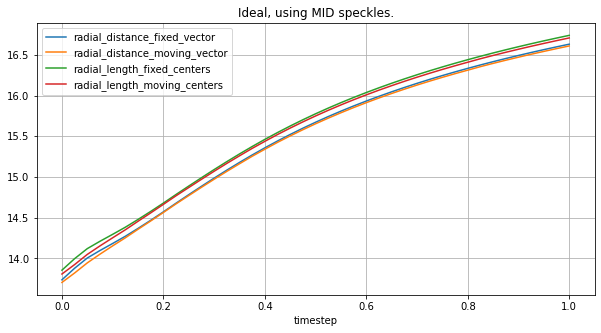

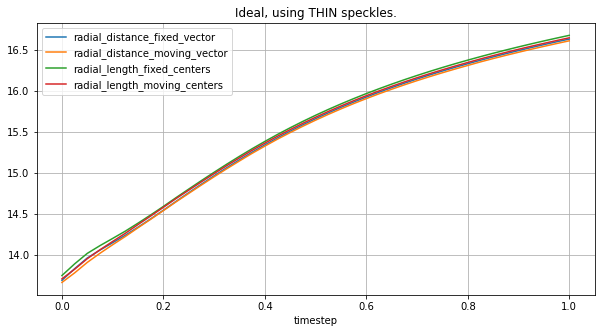

In [17]:
thick_spks = lv_typeA.get_speckles(spk_name="THICK", spk_group="endo", spk_collection="SAMPLE")
mid_spks = lv_typeA.get_speckles(spk_name="MID", spk_group="endo", spk_collection="SAMPLE")
thin_spks = lv_typeA.get_speckles(spk_name="THIN", spk_group="endo", spk_collection="SAMPLE")

plot_all_radial_metrics(lv_typeA, thick_spks, "Ideal, using THICK speckles.")
plot_all_radial_metrics(lv_typeA, mid_spks, "Ideal, using MID speckles.")
plot_all_radial_metrics(lv_typeA, thin_spks, "Ideal, using THIN speckles.")

### Comparing Radial metrics at different locations of the geometry:

Now let's compare how the metric behaves when using different speckles at different regions of the geometry:

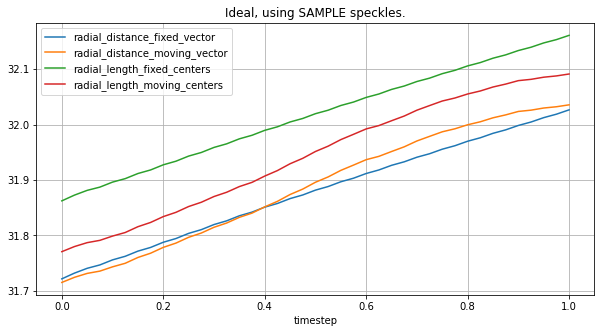

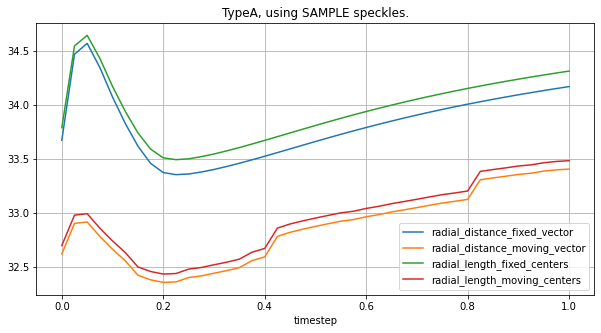

In [18]:
plot_all_radial_metrics(lv_ideal, sample_spk_ideal, "Ideal, using SAMPLE speckles.")
plot_all_radial_metrics(lv_typeA, sample_spk_typeA, "TypeA, using SAMPLE speckles.")

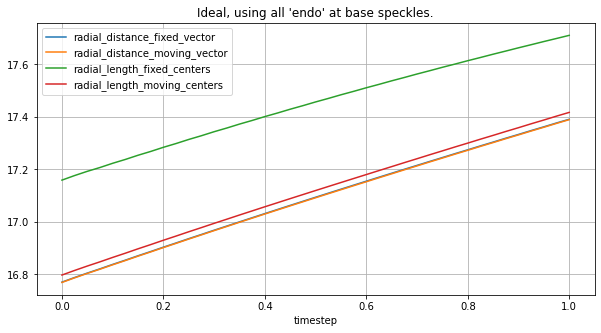

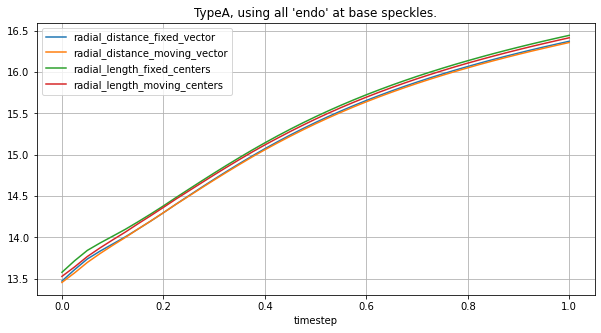

In [19]:
circ_spks = lv_ideal.get_speckles(spk_name="base", spk_group="endo", spk_collection="circ-6")
plot_all_radial_metrics(lv_ideal, circ_spks, "Ideal, using all 'endo' at base speckles.")
circ_spks = lv_typeA.get_speckles(spk_name="base", spk_group="endo", spk_collection="circ-6")
plot_all_radial_metrics(lv_typeA, circ_spks, "TypeA, using all 'endo' at base speckles.")

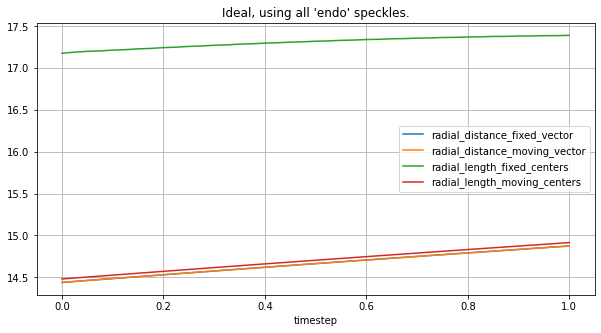

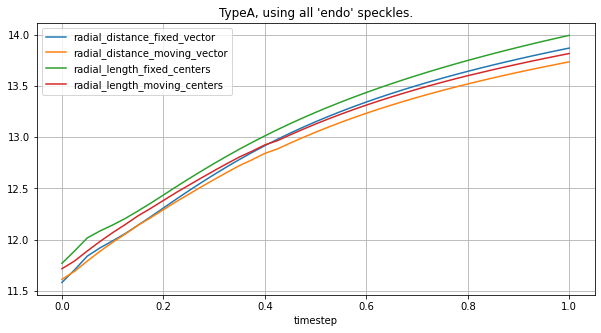

In [20]:
circ_spks = lv_ideal.get_speckles(spk_group="endo", spk_collection="circ-6")
plot_all_radial_metrics(lv_ideal, circ_spks, "Ideal, using all 'endo' speckles.")
circ_spks = lv_typeA.get_speckles(spk_group="endo", spk_collection="circ-6")
plot_all_radial_metrics(lv_typeA, circ_spks, "TypeA, using all 'endo' speckles.")

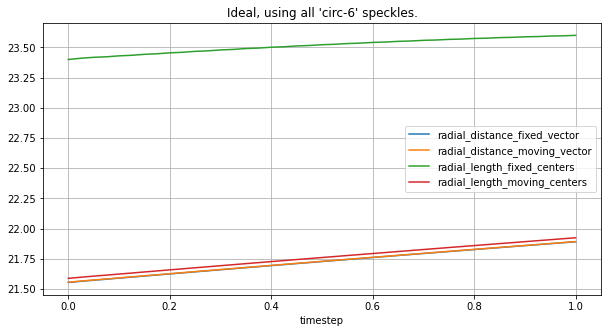

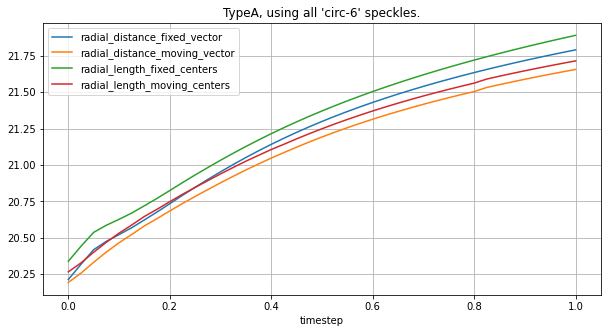

In [21]:
circ_spks = lv_ideal.get_speckles(spk_collection="circ-6")
plot_all_radial_metrics(lv_ideal, circ_spks, "Ideal, using all 'circ-6' speckles.")
circ_spks = lv_typeA.get_speckles(spk_collection="circ-6")
plot_all_radial_metrics(lv_typeA, circ_spks, "TypeA, using all 'circ-6' speckles.")